In [1]:
import sys
import os
import torch
import torchvision.transforms.v2.functional as TF
import matplotlib.pyplot as plt
import math

# import from parent directory
module_path = os.path.abspath(os.path.join('..'))

if module_path not in sys.path:
    sys.path.append(module_path)

import model
import dataset
from config import (
    DS_PATH as ds_path,
    EXPERIMENT_NAME as experiment_name,
    TARGET_CATEGORY as target_category,
    IMG_HEIGHT as img_height,
    IMG_WIDTH as img_width,
    NUM_WORKERS as num_workers,
    TOTAL_EPOCHS as total_epochs,
    BATCH_SIZE as batch_size,
    LEARNING_RATE as learning_rate,
    CURRICULUM as curriculum,
    AUGMENT as augment,
    DROPOUT as dropout,
    PATIENCE as patience,
)

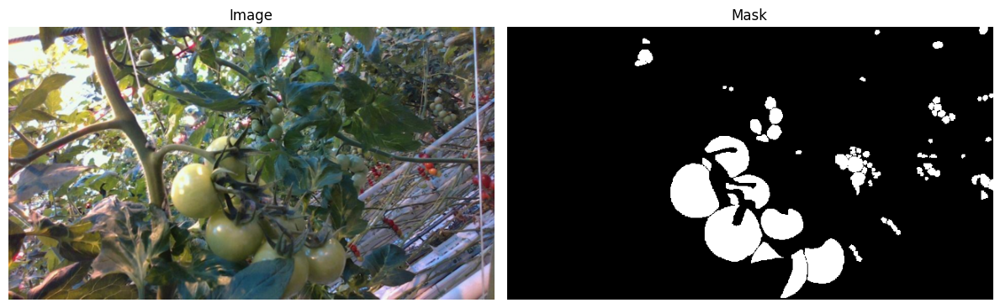

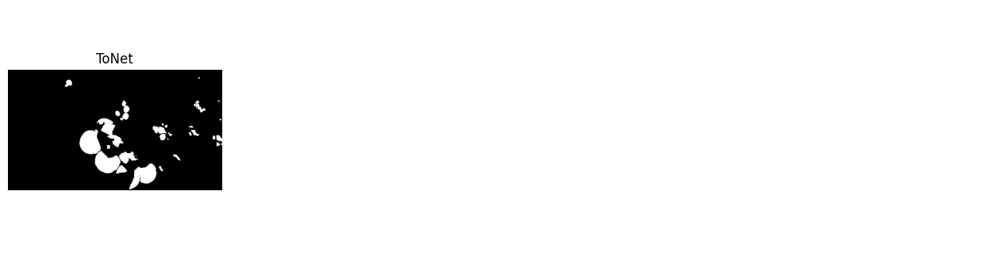

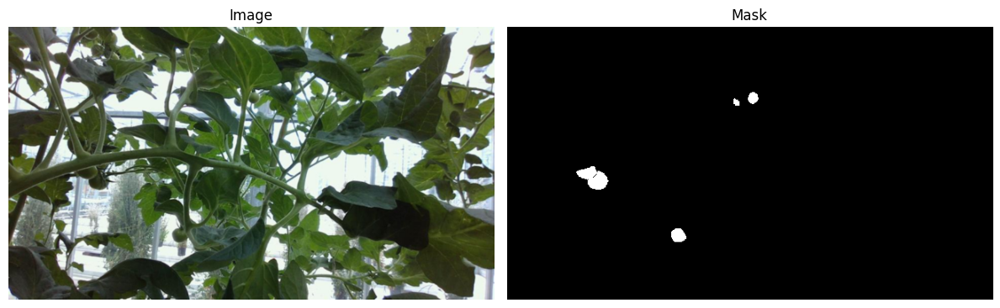

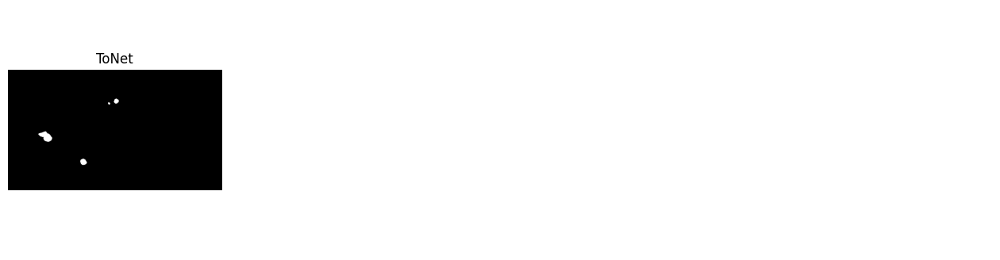

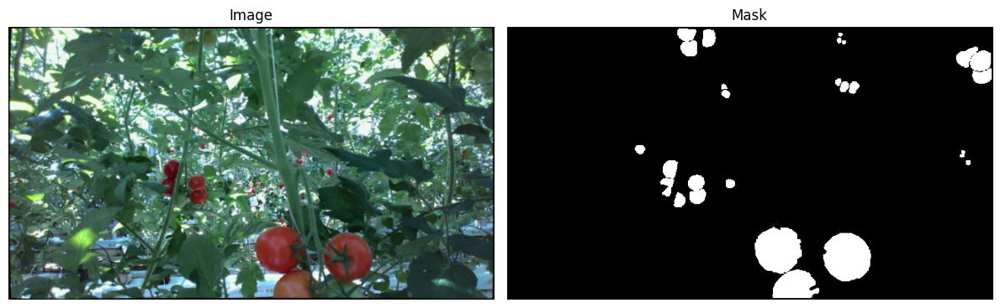

...

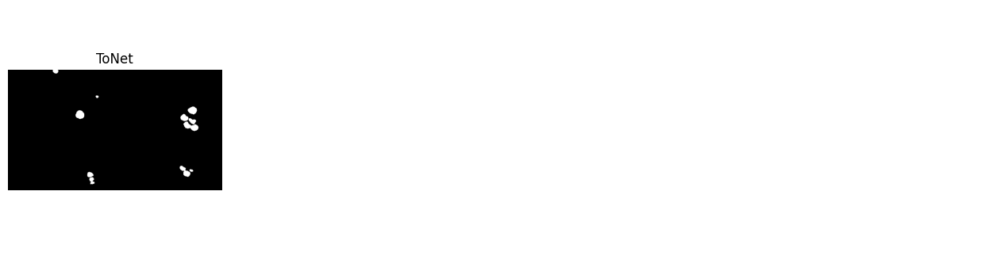

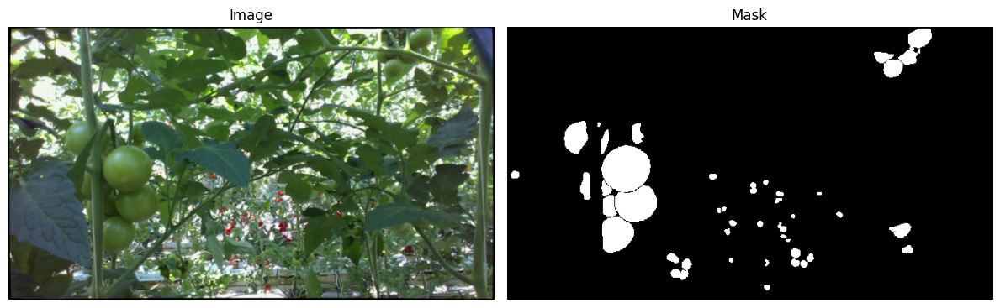

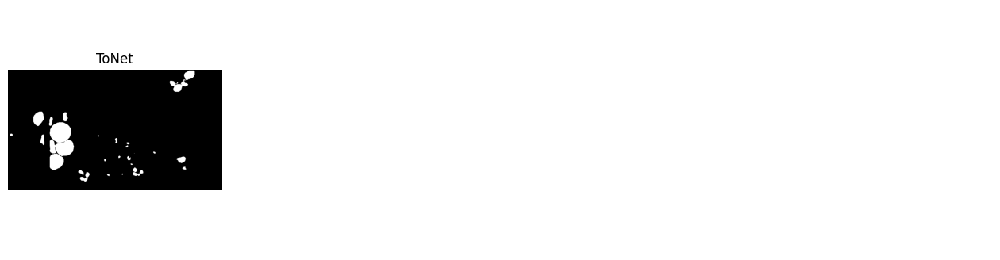

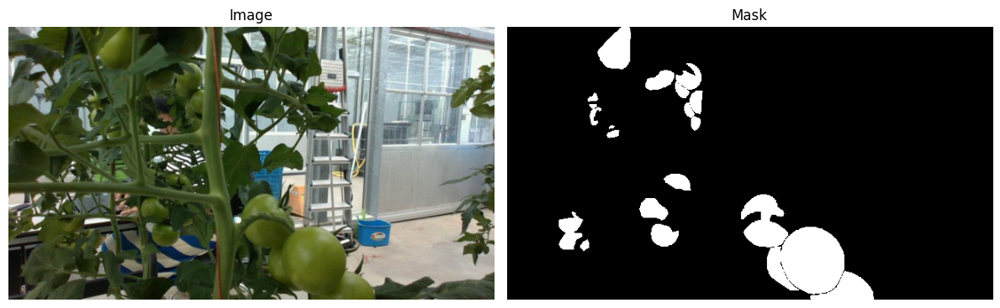

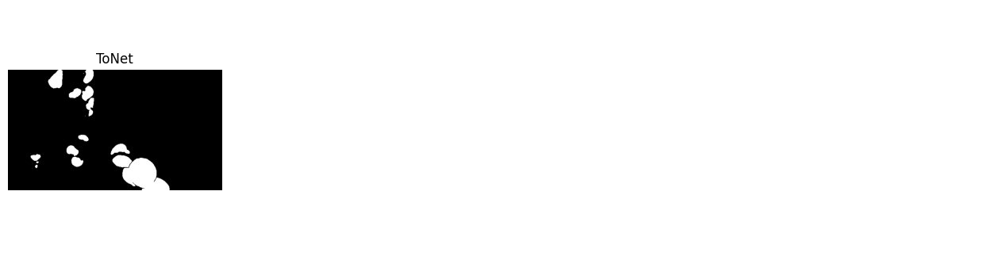

In [2]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

model_classes = [
    model.ToNet,
]

img_path = os.path.join(ds_path, 'images')
msk_path = os.path.join(ds_path, 'masks')
ann_path = os.path.join(ds_path, 'annotations.json')
image_ids = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19]

test_ds = dataset.SimpleDataset(ann_path, img_path, msk_path, image_ids, target_category, img_height, img_width)

for img, mask in test_ds:
    t_img = img.to(device)[None, :, :, :]

    mask = mask * 255
    mask = TF.to_dtype(mask, torch.uint8, scale=True)
    mask = TF.to_pil_image(mask)

    cols = 4
    rows = math.ceil(len(model_classes) / cols)

    # plot original image and mask
    fig, axs = plt.subplots(1, 2, figsize=(12, 4))
    axs[0].imshow(img.permute(1, 2, 0))
    axs[0].set_title("Image")
    axs[0].axis("off")

    axs[1].imshow(mask, cmap="gray")
    axs[1].set_title("Mask")
    axs[1].axis("off")
    plt.tight_layout()
    plt.show()

    fig, axs = plt.subplots(rows, cols, figsize=(cols * 4, rows * 4))
    axs = axs.flatten()

    for i, model in enumerate(model_classes):
        m = model().to(device)
        checkpoint_path = os.path.join('../models/2026-04-12_19-05-46/', m.__class__.__name__)
        best_ckpt = torch.load(os.path.join(checkpoint_path, 'best_model.pt'), weights_only=True, map_location='cpu')
        state_dict = best_ckpt['model_state_dict']

        # remove "_orig_mod." prefix
        state_dict = {
            k.replace("_orig_mod.", ""): v
            for k, v in state_dict.items()
        }

        m.load_state_dict(state_dict)
        m.eval()

        with torch.no_grad():
            pred = m(t_img)
            pred = torch.sigmoid(pred)
            pred = (pred > 0.85).float()
            pred = TF.to_dtype(pred, torch.uint8, scale=True)
            pred = TF.to_pil_image(pred[0])

        axs[i].imshow(pred, cmap="gray")
        axs[i].set_title(m.__class__.__name__)
        axs[i].axis("off")

    # hide unused subplots
    for j in range(i + 1, len(axs)):
        axs[j].axis("off")

    plt.tight_layout
    plt.show()